In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt

In [2]:
import pandas as pd
import numpy as np

file_path = 'E:/2025/ExtensoData_Internship_Work/Projects/Task_4/datasets/Txn_data.csv'
chunksize = 500_000
sample_frac = 0.10

chunks = pd.read_csv(file_path, dtype={2: str, 3: str}, chunksize=chunksize)

sampled_chunks = []

for chunk in chunks:
    sample = chunk.sample(frac=sample_frac)
    sampled_chunks.append(sample)

df_sample = pd.concat(sampled_chunks, ignore_index=True)

print(df_sample.head())
print(f"Sample size: {len(df_sample)} rows")


   Unnamed: 0            Date/Time From_Account_id To_Account_id  amount
0       73139  2024-06-15 11:27:14         5108914       3800427   150.0
1      146943  2024-06-15 15:36:53         2683384       8891961  2000.0
2      460210  2024-06-16 14:37:21         4783607       5292749   400.0
3       19714  2024-06-15 08:03:22         3896152       8013445   500.0
4      448352  2024-06-16 14:04:32         8049707       6409994    50.0
Sample size: 6369062 rows


In [3]:
print(df_sample.dtypes)
print(df_sample.describe())

Unnamed: 0           int64
Date/Time           object
From_Account_id     object
To_Account_id       object
amount             float64
dtype: object
         Unnamed: 0        amount
count  6.369062e+06  6.369062e+06
mean   3.184525e+07  1.443773e+03
std    1.838590e+07  3.156611e+03
min    1.000000e+00  1.000000e+00
25%    1.592278e+07  1.100000e+02
50%    3.184612e+07  3.750000e+02
75%    4.776746e+07  1.150000e+03
max    6.369055e+07  2.000000e+05


In [4]:
df_sample['Date/Time'] = pd.to_datetime(df_sample['Date/Time'])
df_sample['From_Account_id'] =df_sample['From_Account_id'].astype(str)
df_sample['To_Account_id'] =df_sample['To_Account_id'].astype(str)
print(df_sample.columns)

Index(['Unnamed: 0', 'Date/Time', 'From_Account_id', 'To_Account_id',
       'amount'],
      dtype='object')


In [5]:
print(df_sample.dtypes)

Unnamed: 0                  int64
Date/Time          datetime64[ns]
From_Account_id            object
To_Account_id              object
amount                    float64
dtype: object


In [6]:
df_sample.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6369062 entries, 0 to 6369061
Data columns (total 5 columns):
 #   Column           Dtype         
---  ------           -----         
 0   Unnamed: 0       int64         
 1   Date/Time        datetime64[ns]
 2   From_Account_id  object        
 3   To_Account_id    object        
 4   amount           float64       
dtypes: datetime64[ns](1), float64(1), int64(1), object(2)
memory usage: 243.0+ MB


In [7]:
print(df_sample.isnull().sum())


Unnamed: 0         0
Date/Time          0
From_Account_id    0
To_Account_id      0
amount             0
dtype: int64


In [8]:
print(df_sample.duplicated().sum())

0


<Axes: xlabel='Hour'>

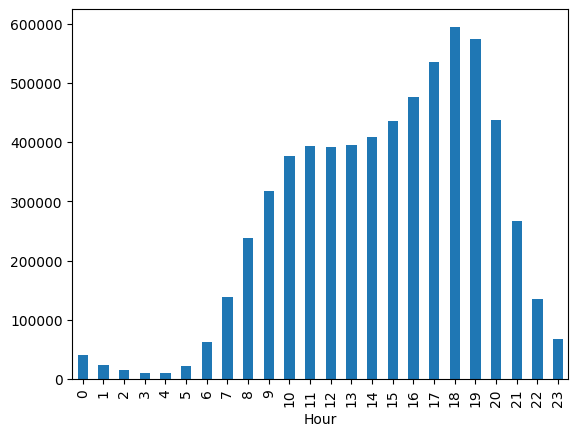

In [ ]:
df_sample['Date'] =df_sample['Date/Time'].dt.date
df_sample['Month'] =df_sample['Date/Time'].dt.month
df_sample['Hour'] =df_sample['Date/Time'].dt.hour


df_sample['Hour'].value_counts().sort_index().plot(kind='bar')

<Axes: xlabel='Date'>

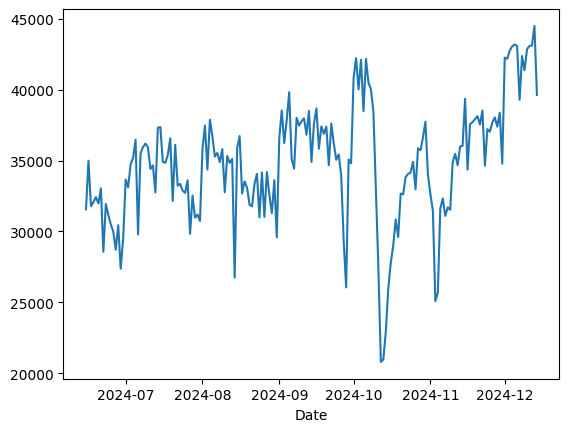

In [30]:
df_sample.groupby('Date').size().plot()

1. Time range
2. Transactions per day
3. Total and average transaction amount per day
4. Transactions by day of week and hour
Visualize transactions by hour for each day
5. Check for missing timestamps or duplicates

In [10]:
start_time =df_sample['Date/Time'].min()
end_time =df_sample['Date/Time'].max()
print(f'Time range in sample : {start_time} to {end_time}')


Time range in sample : 2024-06-15 00:00:09 to 2024-12-14 23:59:49


In [32]:
transactions_per_day =df_sample.groupby(df_sample['Date/Time'].dt.date).size().sort_values(ascending=False)
print("Transactions per day:")
print(transactions_per_day.head(10))

Transactions per day:
Date/Time
2024-12-13    44498
2024-12-05    43193
2024-12-12    43115
2024-12-11    43090
2024-12-06    43080
2024-12-04    43052
2024-12-10    42858
2024-12-03    42750
2024-12-08    42375
2024-12-01    42257
dtype: int64


In [35]:
daily_amount =df_sample.groupby(df_sample['Date/Time'].dt.date)['amount'].agg(['sum','mean']).sort_values(by='sum',ascending=False)  
print("Daily transaction amount summary:")
print(daily_amount.head())

Daily transaction amount summary:
                     sum     mean
Date/Time                        
2024-10-09 74,908,493.10 1,948.81
2024-10-08 73,800,556.06 1,842.71
2024-10-06 72,153,442.55 1,710.81
2024-10-07 71,503,373.65 1,765.65
2024-10-04 68,526,941.30 1,627.22


In [36]:
df_sample['day_of_week'] =df_sample['Date/Time'].dt.day_name()
df_sample['hour_of_day'] =df_sample['Date/Time'].dt.hour
pd.set_option('display.max_columns', None)

transactions_by_day_hour =df_sample.groupby(['day_of_week', 'hour_of_day']).size().unstack(fill_value=0)
print("Transactions by day of week and hour of first week in sample data:")
print(transactions_by_day_hour.head())

Transactions by day of week and hour of first week in sample data:
hour_of_day    0     1     2     3     4     5     6      7      8      9   \
day_of_week                                                                  
Friday       5802  3284  2091  1520  1509  3080  8893  19473  33591  45361   
Monday       5541  3175  2066  1445  1372  3143  9231  20410  34761  46146   
Saturday     7013  4257  2942  2095  1851  3160  7977  18690  32604  43948   
Sunday       5644  3289  2149  1512  1350  3013  8725  19420  34010  45460   
Thursday     5490  3133  2070  1525  1494  3137  9110  20158  34959  45759   

hour_of_day     10     11     12     13     14     15     16     17     18  \
day_of_week                                                                  
Friday       54018  57170  56838  57876  60538  63630  69348  77481  85646   
Monday       54617  56223  55691  56626  58152  61887  67365  75852  84231   
Saturday     50105  51873  51991  51215  52599  57235  63997  74881  83704

In [37]:
transactions_by_day = transactions_by_day_hour.sum(axis=1) #adds across columns
transactions_by_hour = transactions_by_day_hour.sum(axis=0) #adds across rows

print(transactions_by_day)

day_max = transactions_by_day.idxmax()
max_value_day = transactions_by_day.max()

day_min = transactions_by_day.idxmin()
min_value_day = transactions_by_day.min()

print(f" Max transactions on : {day_max} ({max_value_day} transactions)")
print(f" Min transactions on: {day_min} ({min_value_day} transactions)")

hour_max = transactions_by_hour.idxmax()
max_value_hour = transactions_by_hour.max()

hour_min = transactions_by_hour.idxmin()
min_value_hour = transactions_by_hour.min()

print(f"Max transactions at hour: {hour_max}:00 ({max_value_hour} transactios)")
print(f"Min transactions at hour: {hour_min}:00 ({min_value_hour} transactions)")

day_of_week
Friday       926359
Monday       906782
Saturday     870097
Sunday       914814
Thursday     915667
Tuesday      917563
Wednesday    917780
dtype: int64
 Max transactions on : Friday (926359 transactions)
 Min transactions on: Saturday (870097 transactions)
Max transactions at hour: 18:00 (594906 transactios)
Min transactions at hour: 4:00 (10244 transactions)


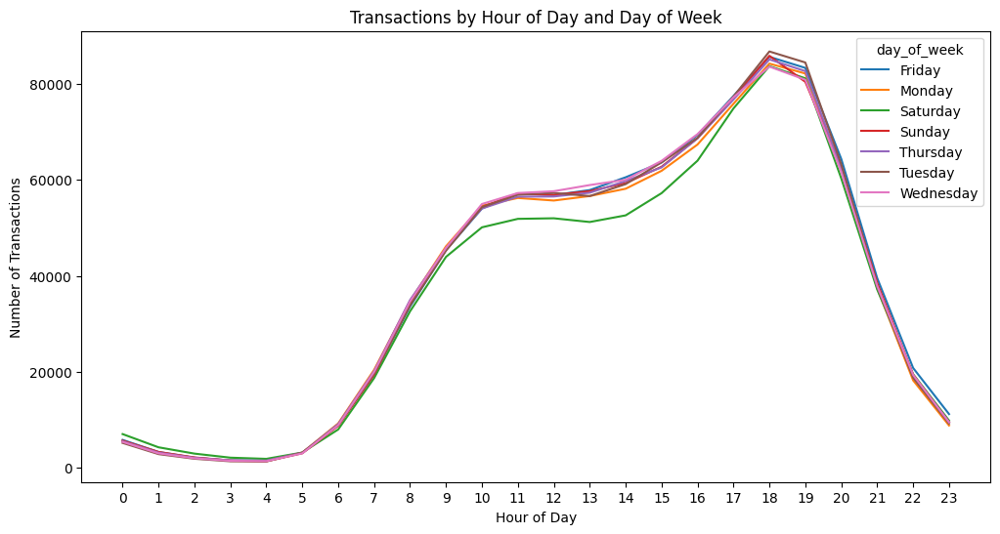

In [15]:
ax = transactions_by_day_hour.T.plot(figsize=(12,6))
plt.title("Transactions by Hour of Day and Day of Week")
plt.xlabel("Hour of Day")
plt.ylabel("Number of Transactions")

ax.set_xticks(range(24))
ax.set_xticklabels([str(i) for i in range(24)])
plt.show()

In [16]:
missing_dates =df_sample['Date/Time'].isnull().sum()
duplicate_rows =df_sample.duplicated().sum()
print(f"Missing timestamps: {missing_dates}")
print(f"Duplicate rows: {duplicate_rows}")

Missing timestamps: 0
Duplicate rows: 0


First chunk: Transaction Amount Analysis
1. What is the overall distribution of transaction amounts ?
(Summary statistics and histogram)
2. Are there any outliers or extreme values?
(Boxplot and quantiles)
3. What is the total and average transaction amount?
4. How does the transaction amount vary over time?
(Daily or hourly aggregates)
5. Are there differences in amounts by transaction direction?
(From_Account_id vs To_Account_id patterns if relevant)

count   6,369,062.00
mean        1,443.77
std         3,156.61
min             1.00
25%           110.00
50%           375.00
75%         1,150.00
max       200,000.00
Name: amount, dtype: float64


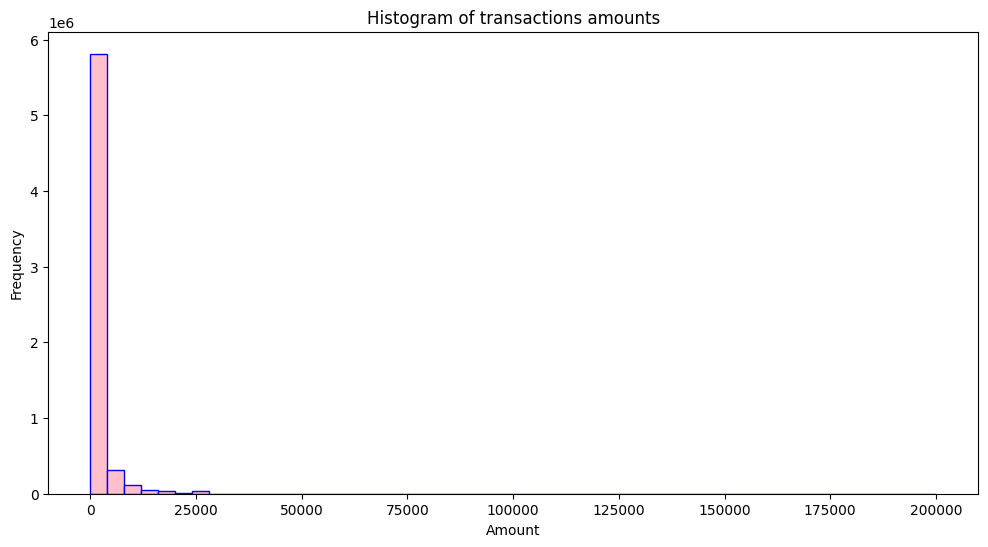

In [17]:
#1. Overal distribution
pd.set_option('display.float_format', '{:,.2f}'.format)
amount_stats =df_sample['amount'].describe()
print(amount_stats)


plt.figure(figsize=(12,6))
plt.hist(df_sample['amount'], color='pink',edgecolor='blue', bins=50)
plt.title("Histogram of transactions amounts")
plt.xlabel('Amount')
plt.ylabel('Frequency')
plt.show()

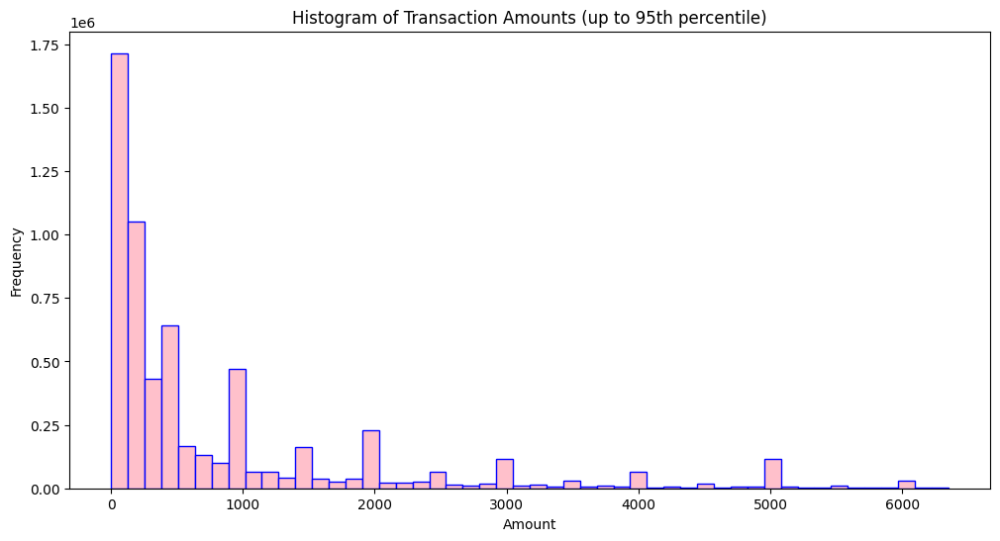

In [18]:


# Optional: compute 95th percentile to cap the range
cap =df_sample['amount'].quantile(0.95)

# Filter the data to exclude extreme outliers
filtered_amounts =df_sample[df_sample['amount'] <= cap]['amount']

plt.figure(figsize=(12, 6))
plt.hist(filtered_amounts, bins=50, color='pink', edgecolor='blue')
plt.title("Histogram of Transaction Amounts (up to 95th percentile)")
plt.xlabel("Amount")
plt.ylabel("Frequency")
plt.show()


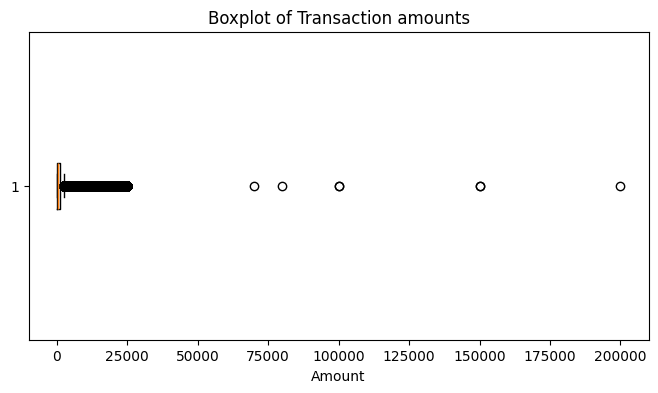

In [19]:
plt.figure(figsize=(8,4))
plt.boxplot(df_sample['amount'], vert=False)
plt.title("Boxplot of Transaction amounts")
plt.xlabel('Amount')
plt.show()

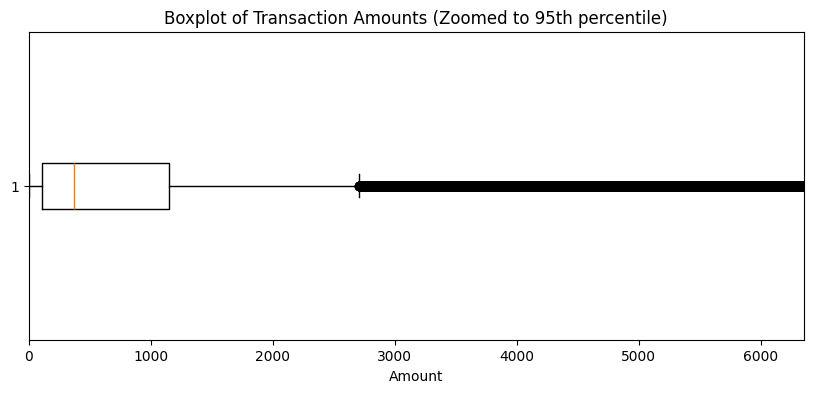

In [20]:
import matplotlib.pyplot as plt

# Set a cap on the x-axis at the 95th percentile
cap =df_sample['amount'].quantile(0.95)

plt.figure(figsize=(10, 4))
plt.boxplot(df_sample['amount'], vert=False)
plt.xlim(0, cap)  # Limit x-axis
plt.title("Boxplot of Transaction Amounts (Zoomed to 95th percentile)")
plt.xlabel("Amount")
plt.show()


In [21]:
#total and average transaction amount overall
total_amount =df_sample['amount'].sum()
average_amount =df_sample["amount"].mean()
print(f"Total transaction amount: {total_amount}")
print(f"Average transaction amount: {average_amount}")

Total transaction amount: 9195482280.77
Average transaction amount: 1443.7733972082547


In [41]:
#transaction amount over time 
daily_amount =df_sample.groupby(df_sample['Date/Time'].dt.date)['amount'].agg(['sum','mean']).sort_values(by='mean', ascending=True)
print("Daily transaction amount summary:")
print(daily_amount.head())

Daily transaction amount summary:
                     sum     mean
Date/Time                        
2024-08-10 35,936,546.76 1,096.83
2024-09-14 39,328,773.24 1,126.71
2024-08-03 39,087,788.52 1,137.40
2024-08-17 37,382,541.19 1,143.90
2024-07-27 34,723,219.90 1,163.49


In [46]:
#transaction amount over time 
monthly_amount =df_sample.groupby(df_sample['Date/Time'].dt.month)['amount'].agg(['sum','mean']).sort_values(by='sum', ascending=True)
print("Monthly transaction amount summary:")
print(monthly_amount)

Monthly transaction amount summary:
                       sum     mean
Date/Time                          
6           717,187,547.91 1,445.69
12          843,269,480.63 1,422.65
8         1,385,895,199.08 1,321.17
7         1,470,779,259.34 1,395.25
9         1,492,985,720.82 1,379.71
11        1,586,326,210.86 1,515.72
10        1,699,038,862.13 1,620.56


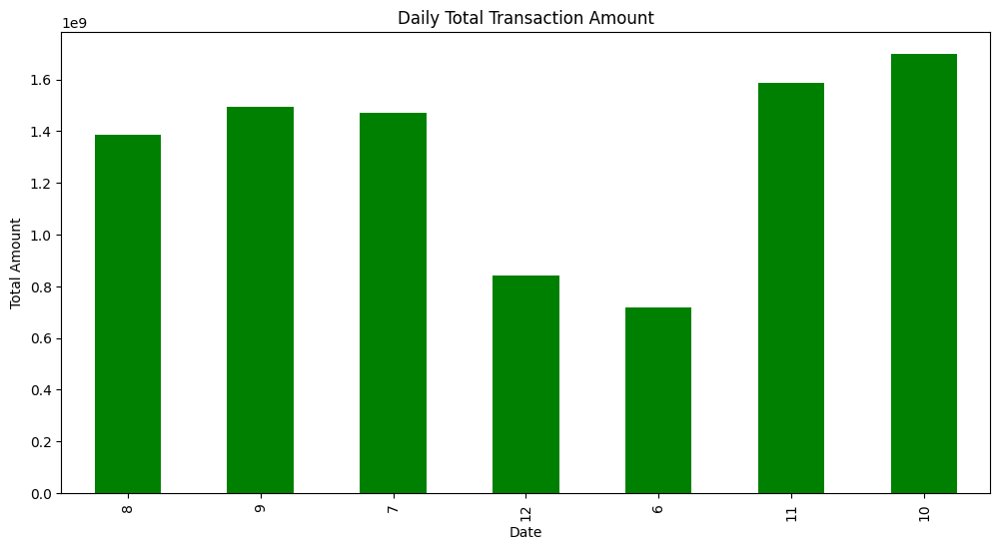

In [45]:
monthly_amount['sum'].plot(kind='bar', figsize=(12,6), color='green')
plt.title('Daily Total Transaction Amount')
plt.xlabel('Date')
plt.ylabel('Total Amount')
plt.show()

First chunk sender & receiver amount analysis
1. What is the total amount sent by each From_Account_id?
2. What is the total amount received by each To_Account_id?
3. How many transactions does each sender and receiver have?
4. What are the average transaction amounts per sender and receiver?
5. Are there accounts that appear both as sender and receiver?

In [48]:
Total_amount_sent_per_account =df_sample.groupby(df_sample['From_Account_id'])['amount'].sum().sort_values(ascending=False)
print(Total_amount_sent_per_account)

Total_amount_received_per_account =df_sample.groupby(df_sample['To_Account_id'])['amount'].sum().sort_values(ascending=False)
print(Total_amount_received_per_account)

From_Account_id
4248684    34,126,621.34
227824      3,499,224.00
337555      3,438,545.00
6879977     3,232,172.25
4890069     1,739,980.50
                ...     
10101518            1.00
2051087             1.00
9178854             1.00
9973701             1.00
8395594             1.00
Name: amount, Length: 1580562, dtype: float64
To_Account_id
513553     21,491,226.00
6879977     3,732,876.00
10583578    2,899,806.00
4890069     2,735,588.50
638686      2,308,773.00
                ...     
3748327             1.00
10315111            1.00
5544168             1.00
5543813             1.00
3931208             1.00
Name: amount, Length: 1411226, dtype: float64


In [25]:

count_sent =df_sample.groupby('From_Account_id').size().sort_values(ascending=False)
print("Top 10 accounts by number of transactions sent: ")
print(count_sent.head(10))

count_received =df_sample.groupby('To_Account_id').size().sort_values(ascending=False)
print("Top 10 accounts by number of transactions received:")
print(count_received.head(10))

Top 10 accounts by number of transactions sent: 
From_Account_id
4248684    1534
5614903     500
227824      419
6879977     323
337555      322
424326      318
558941      237
478281      233
271073      229
4015755     220
dtype: int64
Top 10 accounts by number of transactions received:
To_Account_id
513553     884
2452609    541
61156      514
686464     463
4890069    436
6879977    400
165891     365
4015755    359
35674      343
223026     321
dtype: int64


In [26]:
Average_transaction_amount_per_sender =df_sample.groupby(df_sample['From_Account_id'])['amount'].mean().sort_values(ascending=False)
print("Top 10 accounts by average amount sent")
print(Average_transaction_amount_per_sender.head(10))
Average_transaction_amount_per_receiver =df_sample.groupby(df_sample['To_Account_id'])['amount'].mean().sort_values(ascending=False)
print("Top 10 accounts by average amount received")
print(Average_transaction_amount_per_receiver.head(10))


Top 10 accounts by average amount sent
From_Account_id
115L21    200,000.00
415L21    150,000.00
325L21    150,000.00
545L21    100,000.00
575L21     90,000.00
285L21     70,000.00
2637998    25,000.00
7717456    25,000.00
2985655    25,000.00
4698135    25,000.00
Name: amount, dtype: float64
Top 10 accounts by average amount received
To_Account_id
225L21    200,000.00
515L21    150,000.00
415L21    150,000.00
615L21    100,000.00
715L21    100,000.00
565L21     80,000.00
355L21     70,000.00
144452     25,000.00
5482428    25,000.00
284569     25,000.00
Name: amount, dtype: float64


In [50]:
#accounts appearing both as sender and receiver
senders = set(df_sample['From_Account_id'].unique())
receivers = set(df_sample['To_Account_id'].unique())
both_roles = senders.intersection(receivers)
print(f"Number of accounts that appear both as sender and receiver: {len(both_roles)}")
print("\n List of such accounts: ")
# print(sorted(list(both_roles)))

all_accounts = senders.union(receivers)
print(f"\nTotal unique accounts involved (either as sender or receiver): {len(all_accounts)}")

Number of accounts that appear both as sender and receiver: 1026661

 List of such accounts: 

Total unique accounts involved (either as sender or receiver): 1965127


In [28]:
#accounts that only send but never receive
only_senders = senders - receivers
print(f"Only Senders ({len(only_senders)} accounts):")
print(sorted(list(only_senders)))

Only Senders (553901 accounts):
['10000024', '1000003', '10000030', '10000071', '10000072', '10000075', '10000103', '10000104', '10000122', '10000138', '10000148', '10000163', '1000017', '10000176', '10000177', '10000185', '10000186', '10000207', '10000215', '10000216', '1000022', '10000242', '10000243', '10000249', '10000268', '10000291', '10000299', '1000030', '10000324', '10000342', '10000364', '10000412', '10000413', '10000448', '1000046', '10000461', '10000470', '10000471', '10000490', '10000504', '10000518', '10000582', '10000584', '10000595', '10000599', '10000603', '10000629', '10000633', '10000634', '10000652', '10000662', '10000687', '10000701', '10000706', '10000712', '10000718', '1000072', '10000771', '10000788', '10000811', '10000856', '10000864', '10000879', '10000890', '10000897', '10000907', '10000912', '10000942', '10000949', '1000095', '10000954', '10000965', '10000971', '10000989', '10001028', '10001042', '10001044', '10001048', '10001050', '10001051', '10001055', '1

In [29]:
#accounts that only receive but never send
only_receivers = receivers - senders
print(f"\n Only Receivers ({len(only_receivers)} accounts):")
print(sorted(list(only_receivers)))


 Only Receivers (384565 accounts):
['10000054', '10000066', '10000150', '10000168', '10000169', '10000172', '10000188', '10000203', '10000246', '10000267', '10000283', '10000297', '10000321', '10000322', '1000033', '10000332', '10000371', '10000385', '10000393', '10000396', '10000410', '1000043', '10000437', '10000452', '10000462', '10000587', '10000605', '10000615', '10000622', '10000639', '10000647', '10000650', '10000673', '10000690', '10000695', '10000699', '10000709', '10000729', '10000732', '10000737', '10000774', '10000782', '10000789', '10000795', '10000796', '10000814', '10000821', '10000836', '1000085', '10000865', '10000867', '10000875', '1000089', '10000901', '10000909', '10000910', '10000916', '10000928', '10000937', '10000961', '1000099', '10001008', '10001015', '10001026', '1000104', '10001078', '10001097', '10001109', '10001116', '10001120', '10001123', '1000114', '10001140', '10001179', '10001234', '1000125', '10001253', '1000128', '10001288', '10001304', '10001349', 